In [1]:
### Week 5 Midterm Assignment by Maya Coronado 
### Description: To run data looking at the income for 5 SPAs in Los Angeles and draw interpretations to assist with midterm presentation. 
### The selected SPAs are 1, 2, 4, 5, and 6.
### Research Question: What contributes to food security and associated health outcomes at the community level in Los Angeles (LA) County?
### Addn. Questions We Are Exploring: Which communities are particularly vulnerable to food insecurity?
### How have disparities in food insecurity within LA County SPAs changed throughout the COVID-19 pandemic?
### What are the demographics of the most vulnerable communities?
### What are the impacts of food insecurity on birth outcomes, specifically low birth weight?

In [1]:
### Data sources used in this notebook inlcude: 
### Census Tracts Data for LA County in 2020, Median Household Income in LA County in 2022, Race Data (Soruced from LA Times Article, Week 3 Lab)

In [2]:
# I will start the notebook by importing all the libraries I will need to use for various tasks. 
import pandas as pd
import geopandas as gpd
import folium
import matplotlib.pyplot as plt
import contextily as ctx 

In [3]:
# I'll start by bringing in the datafile I need. I already removed the SPAs that my group will not be looking at to make my life easier. 
# I will be using the spas.csv and title it as df

df = pd.read_csv('spas.csv')

In [4]:
# Now I will run the data size.
df.shape

(1433, 13)

In [5]:
# Here's the head command. 
df.head

<bound method NDFrame.head of            tract  med_hh_income  med_hh_income_universe     ami_category  \
0     6037901210        74219.0                     656       Low Income   
1     6037910719        71774.0                     854       Low Income   
2     6037900102        41713.0                     295  Very Low Income   
3     6037900103        42400.0                    1657  Very Low Income   
4     6037900104        49886.0                    1684  Very Low Income   
...          ...            ...                     ...              ...   
1428  6037553702        55747.0                    1207  Very Low Income   
1429  6037553801        57663.0                    1027  Very Low Income   
1430  6037553802        43395.0                    2087  Very Low Income   
1431  6037553901        75000.0                    1540       Low Income   
1432  6037553902        54554.0                    1490  Very Low Income   

     below_med_income below_60pct_med_income below_modera

In [6]:
# I'll now check to see if there is any missing data. 
df.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1433 entries, 0 to 1432
Data columns (total 13 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   tract                   1433 non-null   int64  
 1   med_hh_income           1413 non-null   float64
 2   med_hh_income_universe  1433 non-null   int64  
 3   ami_category            1413 non-null   object 
 4   below_med_income        1413 non-null   object 
 5   below_60pct_med_income  1413 non-null   object 
 6   below_moderate_income   1413 non-null   object 
 7   sup_dist                1433 non-null   object 
 8   csa                     1433 non-null   object 
 9   spa                     1433 non-null   object 
 10  ESRI_OID                1433 non-null   int64  
 11  Shape__Area             1433 non-null   float64
 12  Shape__Length           1433 non-null   float64
dtypes: float64(3), int64(3), object(7)
memory usage: 145.7+ KB


In [7]:
# I need to make sure that we have the leading zeroes in place, so I'll write the code for that. 
df = pd.read_csv(
    'spas.csv',
    dtype=
    {
        'tract':str
    
    }
)

In [8]:
# I'll run the head function againt to ensure that it's been put into place. 
df.head()

,tract,med_hh_income,med_hh_income_universe,ami_category,below_med_income,below_60pct_med_income,below_moderate_income,sup_dist,csa,spa,ESRI_OID,Shape__Area,Shape__Length
0,06037901210,74219.0,656,Low Income,Yes,No,Yes,District 5,Unincorporated - Elizabeth Lake,SPA 1 - Antelope Valley,3737,2.478267e+08,98464.22500
1,06037910719,71774.0,854,Low Income,Yes,No,Yes,District 5,City of Palmdale,SPA 1 - Antelope Valley,3747,2.144699e+07,21431.71045
2,06037900102,41713.0,295,Very Low Income,Yes,Yes,Yes,District 5,Unincorporated - Hi Vista,SPA 1 - Antelope Valley,3749,4.740482e+09,321155.35140
3,06037900103,42400.0,1657,Very Low Income,Yes,Yes,Yes,District 5,Unincorporated - Lake Los Angeles,SPA 1 - Antelope Valley,3750,2.149792e+08,63903.54937
4,06037900104,49886.0,1684,Very Low Income,Yes,No,Yes,District 5,Unincorporated - Lake Los Angeles,SPA 1 - Antelope Valley,3751,4.587277e+08,85970.76044


In [9]:
# It works!
# Leaving the column names as is as they're straightforward to me. I'll pull together some stats to reference. I will be working with the median household income. 
df['med_hh_income'].head()

0    74219.0
1    71774.0
2    41713.0
3    42400.0
4    49886.0
Name: med_hh_income, dtype: float64

In [10]:
# First, here's the mean. 
df['med_hh_income'].mean()

75504.65180467091

In [11]:
# The mean of the 5 SPAs is $75k. What about the median?
df['med_hh_income'].median()

66016.0

In [12]:
# Ok, so it looks like the median income is 66k. I think the median is a better income to reference as half of the population falls below 66k and half
# of the population makes more than this value. 
# That said, I'll make sure to run sme basic descriptive stats that are handy. 
df['med_hh_income'].describe()

count      1413.000000
mean      75504.651805
std       38182.119517
min        4918.000000
25%       48438.000000
50%       66016.000000
75%       95613.000000
max      250001.000000
Name: med_hh_income, dtype: float64

<Axes: ylabel='Frequency'>

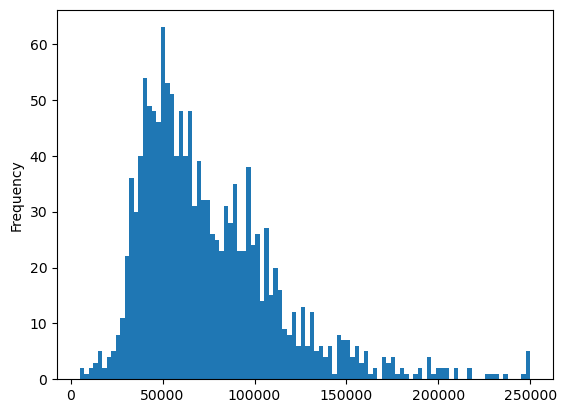

In [13]:
# Next, I will pull together some charts and graphs that help illustrate the income breakdowns. 
# I want to see a visual distribution of income in LA County using 100 different census tracts. 
df['med_hh_income'].plot.hist(bins=100)

In [14]:
# A good chunk of the data falls below 150k, with a huge cluster of census tracts before that 100k mark, which aligns with our descriptive stats 
# that we ran in the previous cell.
# Although this gives some insight, we don't really see which spas belong to which income levels or anything that really gives us solid 
# evidence as to where the financial distribution lies. So, I want to focus on that next. 

In [15]:
# I will now look to see which SPAs contain the 20 highest census tracts. So I will need to sort the data. 
df_sorted = df.sort_values(by='med_hh_income', ascending=False)

In [16]:
# I will run it to ensure that it has sorted correctly. My guess is we'll see a lot of SPA 5 on this list. 
df_sorted [['med_hh_income', 'spa']].head(20)

,med_hh_income,spa
1037,250001.0,SPA 5 - West
529,250001.0,SPA 2 - San Fernando
1038,250001.0,SPA 5 - West
1033,250001.0,SPA 5 - West
1185,250001.0,SPA 5 - West
1039,246750.0,SPA 5 - West
339,236709.0,SPA 2 - San Fernando
1035,231188.0,SPA 5 - West
969,228836.0,SPA 4 - Metro
342,225819.0,SPA 2 - San Fernando


<Axes: title={'center': 'Highest Median Household Incomes by SPA in LA County in 2022'}, xlabel='Source: LA Geo Hub (2022)'>

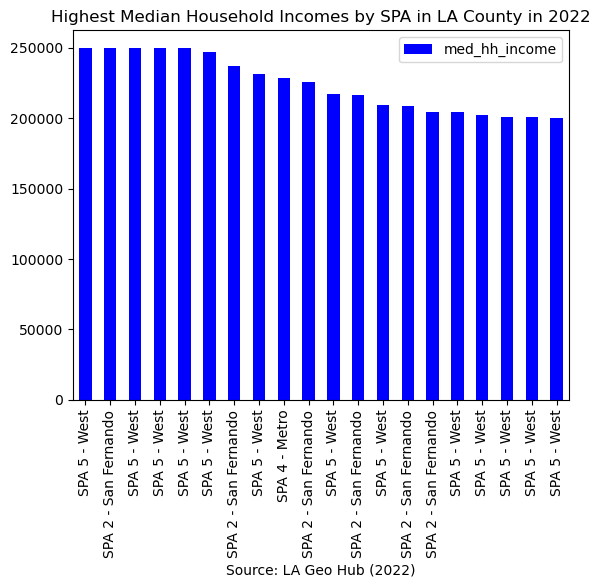

In [17]:
# I was right. SPA 5 represents 65% percent of this list. I will also visualize it's easier to look at than a long list (in my opinion).
df_sorted.head(20).plot.bar(x='spa',
                             y='med_hh_income',
                             title='Highest Median Household Incomes by SPA in LA County in 2022',
                             color='blue',
                            xlabel='Source: LA Geo Hub (2022)')

In [18]:
# While we're at it, I'll illustrate what SPAs represent the 20 lowest median household incomes. 
# I'll sort it accordingly.
df_sorted = df.sort_values(by='med_hh_income', ascending = True)

In [19]:
# Here's the list now that I input the above statement. 
df_sorted [['med_hh_income', 'spa']].head(20)

,med_hh_income,spa
703,4918.0,SPA 4 - Metro
702,7193.0,SPA 4 - Metro
1225,9722.0,SPA 6 - South
701,11153.0,SPA 4 - Metro
708,11430.0,SPA 4 - Metro
711,12283.0,SPA 4 - Metro
700,12344.0,SPA 4 - Metro
1212,13630.0,SPA 6 - South
1080,15417.0,SPA 5 - West
842,16471.0,SPA 4 - Metro


<Axes: title={'center': 'Lowest Median Household Incomes by SPA in LA County in 2022'}, xlabel='Source: LA Geo Hub (2022)'>

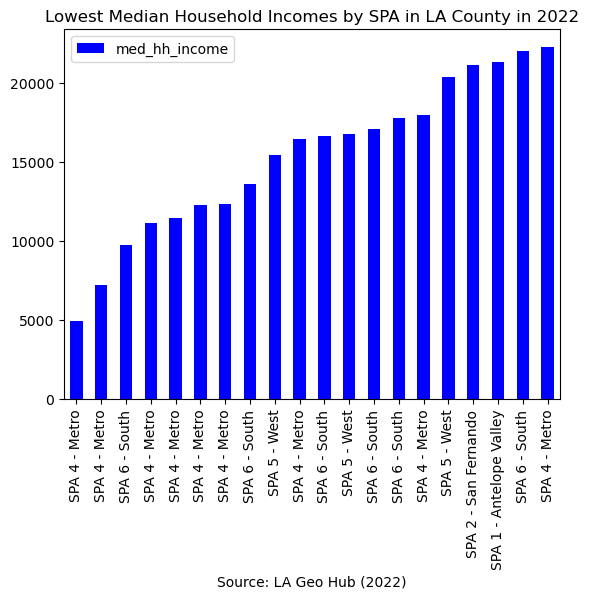

In [20]:
# SPA 4 (45% of the 20 census tracts) and SPA 6 (30% of the census tracts) come up most frequently.
# Let's chart this too. 
df_sorted.head(20).plot.bar(x='spa',
                             y='med_hh_income',
                             title='Lowest Median Household Incomes by SPA in LA County in 2022',
                             color='blue',
                            xlabel='Source: LA Geo Hub (2022)')

<Axes: title={'center': 'SPAs Displayed by Median Household Income in LA County in 2022'}, xlabel='med_hh_income', ylabel='spa'>

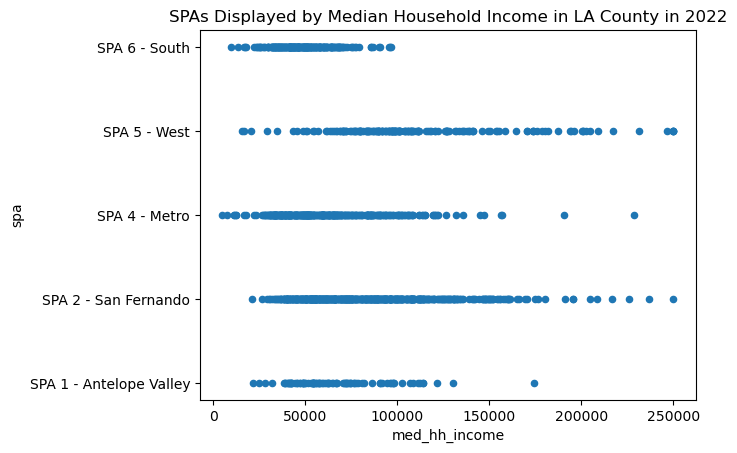

In [21]:
# I'd like to see how the 5 SPAs we ranked against one another stacks up. I'll use a scatterplot to chart it. 
df.plot.scatter(x='med_hh_income', y='spa', title='SPAs Displayed by Median Household Income in LA County in 2022')

In [22]:
# This isn't bad, but I thikn it'd be more helpful to have the chart ranked numerically. I'll now attempt to improve this chart. 
df = df.sort_values (by='spa', ascending = False)

In [23]:
# Double checking it was sorted by running the head function. 
df.head()

,tract,med_hh_income,med_hh_income_universe,ami_category,below_med_income,below_60pct_med_income,below_moderate_income,sup_dist,csa,spa,ESRI_OID,Shape__Area,Shape__Length
1432,06037553902,54554.0,1490,Very Low Income,Yes,No,Yes,District 4,City of Paramount,SPA 6 - South,4817,1.129240e+07,14601.412320
1279,06037234200,85429.0,1162,Low Income,No,No,Yes,District 2,Los Angeles - Crenshaw District,SPA 6 - South,3304,9.553867e+06,12926.123960
1277,06037234001,85757.0,1033,Low Income,No,No,Yes,District 2,Los Angeles - Leimert Park,SPA 6 - South,3302,7.211329e+06,15620.896870
1276,06037232800,38897.0,933,Very Low Income,Yes,Yes,Yes,District 2,Los Angeles - South Park,SPA 6 - South,3301,4.643363e+06,8648.316981
1275,06037232702,35114.0,1011,Extremely Low Income,Yes,Yes,Yes,District 2,Los Angeles - West Vernon,SPA 6 - South,3300,4.880011e+06,8854.570671


<Axes: title={'center': 'SPAs Displayed by Median Household Income in LA County in 2022'}, xlabel='med_hh_income', ylabel='spa'>

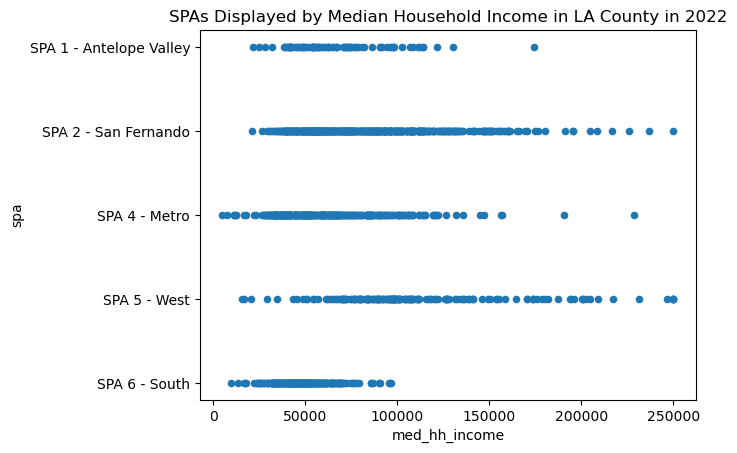

In [24]:
# Looks like it works as SPA 6 is the highest numerically ranked SPA. Here's the chart code. 
df.plot.scatter(x='med_hh_income', y='spa', title='SPAs Displayed by Median Household Income in LA County in 2022')

In [25]:
# It works! 
# Analyzing this chart, we can see that SPA's 1, 4, and 6 have a greater number of census tracts that have a lower median household income than 100k. 
# Although the three have some outliers, their range is much more concentrated than SPA 2 and 5, which suggests that these SPAs may be 
# predominantly lower income than SPA 2 and 5. In turn, their financial position may introduce additional barriers such as adequate healthcare, 
# affordable and nutritious food, and parental stress (from financial standing). These factors can influence the birthweight of their child.

In [26]:
# I will now move onto the mapping section of my assignment. I would like to show my map with the various SPA's outlined by it. That way, we can 
# identify which SPAs may have greater financial disparities. 

In [27]:
import folium

In [28]:
# I want to map LA County, but I need data from two different files. So I will be merging those first. This dataframe will be known as df2. 
df2=gpd.read_file('Census_Tracts_2020.geojson')
df2.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2..."
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2..."


In [29]:
# I will include the tract column for this now. CA = 06 and LA County = 037. 
df2['tract']='06' + '037' + df2 ['CT20']

In [30]:
df2.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry,tract
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2...",06037101222


In [31]:
# I will now have to merge the data. df3 is the combination of my census tract file (df2) and my original SPAs.csv (df).
df3=df2.merge(df,on='tract')

In [32]:
# I need to run the head function to check whether that was successful.
df3.head()

,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry,tract,med_hh_income,med_hh_income_universe,ami_category,below_med_income,below_60pct_med_income,below_moderate_income,sup_dist,csa,spa,ESRI_OID,Shape__Area,Shape__Length
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110,74625.0,1505,Low Income,Yes,No,Yes,District 5,Los Angeles - Tujunga,SPA 2 - San Fernando,2736,1.232981e+07,14765.649000
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122,93125.0,1341,Low Income,No,No,Yes,District 5,Los Angeles - Tujunga,SPA 2 - San Fernando,2737,2.908866e+07,30028.213770
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220,55682.0,1430,Very Low Income,Yes,No,Yes,District 5,Los Angeles - Tujunga,SPA 2 - San Fernando,2738,7.532651e+06,12504.552130
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221,46274.0,1513,Very Low Income,Yes,Yes,Yes,District 5,Los Angeles - Tujunga,SPA 2 - San Fernando,2739,3.874399e+06,8938.421349
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2...",06037101222,30016.0,969,Extremely Low Income,Yes,Yes,Yes,District 5,Los Angeles - Tujunga,SPA 2 - San Fernando,2740,3.090538e+06,9750.960420


In [33]:
pip install geopandas matplotlib pandas

Note: you may need to restart the kernel to use updated packages.


In [34]:
import geopandas as gpd
import matplotlib.pyplot as plt

In [35]:
# Saving the combined csv and geojson to a new file. 
df3.to_file('combineddata.geojson', driver='GeoJSON')

<Axes: >

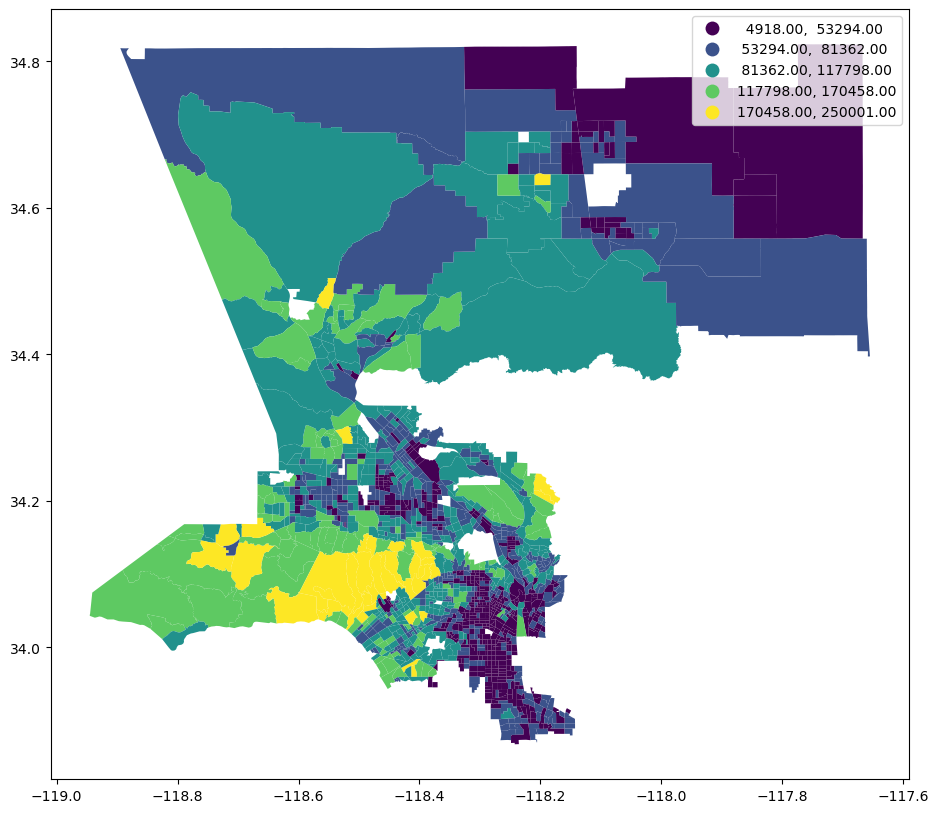

In [38]:
# I'll start by looking at a map using natural breaks. This means that the map will be classified based on clustered values
# in the same class. 
df3.plot(figsize=(12,10),
                 column='med_hh_income',
                 legend=True, 
                 scheme='NaturalBreaks')

In [39]:
# So far, we see that SPAS 1 and 6 have quite a bit of lower income census tracts. There seems to be more variation when looking at SPA 2. 
# SPA 5 is predominantly higher income. 

<Axes: >

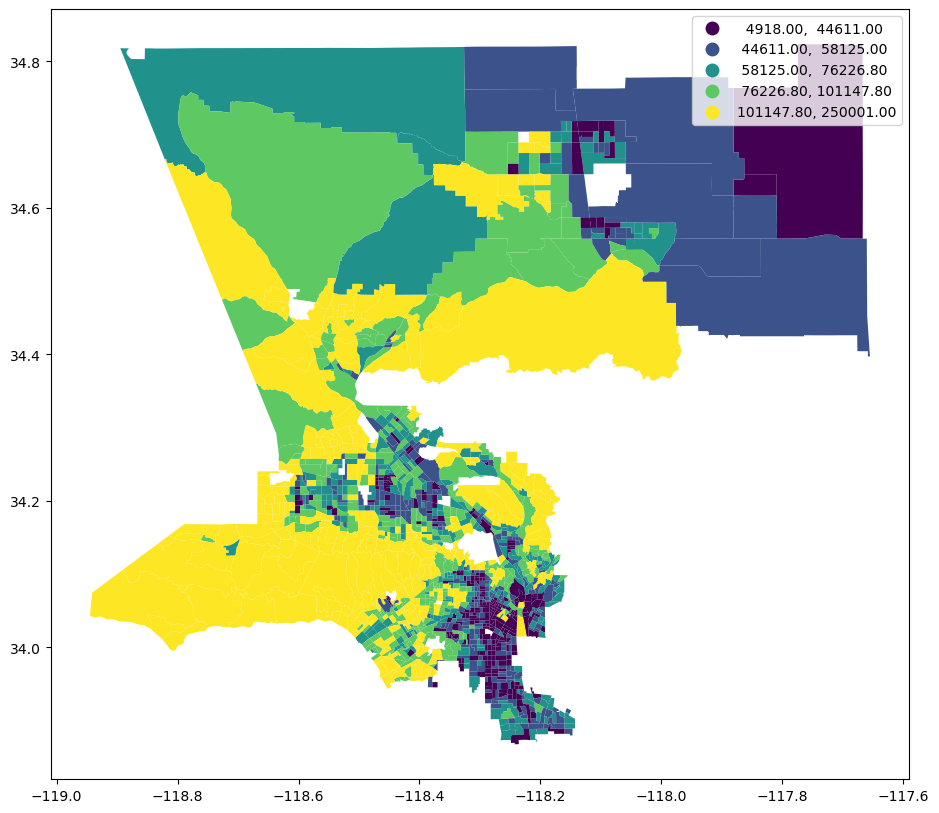

In [40]:
# What if we ran this map using quantiles? That way, we should see that data is broken into different buckets 
# with the same amount of census tracts in them. 
df3.plot(figsize=(12,10),
                 column='med_hh_income',
                 legend=True, 
                 scheme='quantiles')


In [41]:
# Admittedly, I like the natural break map more as I think it's more true to the data breakout. Here, we can see that 1, 4, and 6 have a lot of blue
# and green to them. This is what we saw in previous graphs that we ran. 

In [42]:
# I will now attempt to do a folium map. 

In [43]:
# Loading my geojson data
geo_json_data='combineddata.geojson'

In [44]:
import folium 
import branca

colormap = branca.colormap.LinearColormap(
    vmin=df3["med_hh_income"].quantile(0.0),
    vmax=df3["med_hh_income"].quantile(1),
    colors=["red", "orange", "lightblue", "green", "darkgreen"],
    caption="SPA Level Median Household Income",
)

In [45]:
import folium

# Create a map centered around Los Angeles County
m = folium.Map(location=[34.052235, -118.243683], zoom_start=10)

# Define popup and tooltip settings
popup = folium.GeoJsonPopup(
    fields=["med_hh_income"],  # Adjusted assuming "med_hh_income" is the correct column name
    aliases=["Median HH Income"],  # Adjusted alias for clarity
    localize=True,
    labels=True,
    style="background-color: yellow;",
)

tooltip = folium.GeoJsonTooltip(
    fields=["med_hh_income"],  # Adjusted assuming "med_hh_income" is the correct column name
    aliases=["Median HH Income"],  # Adjusted alias for clarity
    localize=True,
    sticky=False,
    labels=True,
    style="""
        background-color: #F0EFEF;
        border: 2px solid black;
        border-radius: 3px;
        box-shadow: 3px;
    """,
    max_width=800,
)

# Add GeoJson layer
g = folium.GeoJson(
    df3,
    style_function=lambda x: {
        "fillColor": colormap(x["properties"]["med_hh_income"])  # Adjusted to use the correct column name
        if x["properties"]["med_hh_income"] is not None
        else "transparent",
        "color": "black",
        "fillOpacity": 0.4,
    },
    tooltip=tooltip,
    popup=popup,
).add_to(m)

# Add colormap
colormap.add_to(m)

# Display the map
m


In [46]:
m.save('LA_Median_HH_Income.html')

In [47]:
# Based on my previous charts and maps, this interactive map is completely in line with what I'd expect. Much of the higher median income
# census tracts belong in SPA 5 and some of SPA 2. As we go further into the city (such as within SPA 4), the median income 
# begins to decrease. We can also observe this trend in SPA 1's domain. 

In [2]:
### Note: I also pulled together some simple charts for race/ethnicty in LA County to help us better understand the demographic layout.
### The data and statements are predominantly from Week 3's lab. We used this to help guide 
### where we were most interested in looking when it came time to determining the SPAs. 
### This was initially in another notebook, but I have decided to pull it into one for ease of reference. 

In [3]:
# Re-importing pandas just in case. 
import pandas as pd

In [4]:
# Loading the data file. I'll call it rf. 
rf = pd.read_csv('R13280610_SL140.csv')

In [5]:
# Reading shape and head now. 
rf.shape

(2498, 50)

In [6]:
rf.head()

,Geo_FIPS,Geo_NAME,Geo_QNAME,Geo_NATION,Geo_STATE,Geo_COUNTY,Geo_CS,Geo_CT,Geo_PLACE,Geo_CSA,...,SE_T017_020,SE_T017_002,SE_T017_004,SE_T017_006,SE_T017_008,SE_T017_010,SE_T017_012,SE_T017_014,SE_T017_016,SE_T017_018
0,6037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",0,6,37,NaN,101110,NaN,NaN,...,4.121750,4.050484,6.927711,-12.162162,-50.000000,-10.699588,100.0,-53.333333,23.776224,4.305136
1,6037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",0,6,37,NaN,101122,NaN,NaN,...,1.746725,3.140175,7.263028,19.230769,75.000000,-20.808081,-100.0,130.000000,2.586207,-5.739130
2,6037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",0,6,37,NaN,101220,NaN,NaN,...,-0.564972,8.225729,5.354994,-5.555556,-63.636364,29.411765,-100.0,600.000000,-3.809524,-15.015723
3,6037101221,Census Tract 1012.21,"Census Tract 1012.21, Los Angeles County, Cali...",0,6,37,NaN,101221,NaN,NaN,...,0.291206,0.132567,5.444126,-17.977528,-25.000000,-5.747126,0.0,100.000000,-41.666667,0.597780
4,6037101222,Census Tract 1012.22,"Census Tract 1012.22, Los Angeles County, Cali...",0,6,37,NaN,101222,NaN,NaN,...,9.859155,17.241379,27.074236,-19.148936,50.000000,-20.855615,NaN,NaN,-2.500000,-0.763359


In [8]:
# Now running the data types to see what we have 
rf.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2498 entries, 0 to 2497
Data columns (total 50 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Geo_FIPS     2498 non-null   int64  
 1   Geo_NAME     2498 non-null   object 
 2   Geo_QNAME    2498 non-null   object 
 3   Geo_NATION   2498 non-null   int64  
 4   Geo_STATE    2498 non-null   int64  
 5   Geo_COUNTY   2498 non-null   int64  
 6   Geo_CS       0 non-null      float64
 7   Geo_CT       2498 non-null   int64  
 8   Geo_PLACE    0 non-null      float64
 9   Geo_CSA      0 non-null      float64
 10  SE_T004_019  2498 non-null   int64  
 11  SE_T004_001  2498 non-null   int64  
 12  SE_T004_003  2498 non-null   int64  
 13  SE_T004_005  2498 non-null   int64  
 14  SE_T004_007  2498 non-null   int64  
 15  SE_T004_009  2498 non-null   int64  
 16  SE_T004_011  2498 non-null   int64  
 17  SE_T004_013  2498 non-null   int64  
 18  SE_T004_015  2498 non-null   int64  
 19  SE_T00

In [9]:
# Making sure that the Geo_FIPS data is read in with a leading zero.

rf = pd.read_csv(
    'R13280610_SL140.csv',
    dtype=
    {
        'Geo_FIPS':str,
        'Geo_STATE':str,
        'Geo_COUNTY': str
    }
)

In [12]:
# Dropping out columns we don't need! 
rf.columns[rf.isna().all()].tolist()

['Geo_CS', 'Geo_PLACE', 'Geo_CSA']

In [13]:
# axis = 0 drops rows axis = 1 drops columns with null
rf = rf.dropna(axis=1,how="all")

In [14]:
# Hope that worked. Let's check. 
rf.head()

,Geo_FIPS,Geo_NAME,Geo_QNAME,Geo_NATION,Geo_STATE,Geo_COUNTY,Geo_CT,SE_T004_019,SE_T004_001,SE_T004_003,...,SE_T017_020,SE_T017_002,SE_T017_004,SE_T017_006,SE_T017_008,SE_T017_010,SE_T017_012,SE_T017_014,SE_T017_016,SE_T017_018
0,06037101110,Census Tract 1011.10,"Census Tract 1011.10, Los Angeles County, Cali...",0,06,037,101110,4926,3545,2840,...,4.121750,4.050484,6.927711,-12.162162,-50.000000,-10.699588,100.0,-53.333333,23.776224,4.305136
1,06037101122,Census Tract 1011.22,"Census Tract 1011.22, Los Angeles County, Cali...",0,06,037,101122,3728,3186,2614,...,1.746725,3.140175,7.263028,19.230769,75.000000,-20.808081,-100.0,130.000000,2.586207,-5.739130
2,06037101220,Census Tract 1012.20,"Census Tract 1012.20, Los Angeles County, Cali...",0,06,037,101220,3344,2263,1751,...,-0.564972,8.225729,5.354994,-5.555556,-63.636364,29.411765,-100.0,600.000000,-3.809524,-15.015723
3,06037101221,Census Tract 1012.21,"Census Tract 1012.21, Los Angeles County, Cali...",0,06,037,101221,3444,2266,1840,...,0.291206,0.132567,5.444126,-17.977528,-25.000000,-5.747126,0.0,100.000000,-41.666667,0.597780
4,06037101222,Census Tract 1012.22,"Census Tract 1012.22, Los Angeles County, Cali...",0,06,037,101222,2808,1768,1455,...,9.859155,17.241379,27.074236,-19.148936,50.000000,-20.855615,NaN,NaN,-2.500000,-0.763359


In [15]:
# There's quite a few columns so we should slim this down and get to updating the dataframe
columns_to_keep = ['Geo_FIPS',
                   'SE_T004_019',
                   'SE_T004_001',
                   'SE_T004_003',
                   'SE_T004_005',
                   'SE_T004_007',
                   'SE_T004_009',
                   'SE_T004_011',
                   'SE_T004_013',
                   'SE_T004_015',
                   'SE_T004_017']
# New and improved dataframe will be called df2.
rf2 = rf[columns_to_keep]

In [16]:
# Let's see the columns list. 
columns = list(rf2)
columns

['Geo_FIPS',
 'SE_T004_019',
 'SE_T004_001',
 'SE_T004_003',
 'SE_T004_005',
 'SE_T004_007',
 'SE_T004_009',
 'SE_T004_011',
 'SE_T004_013',
 'SE_T004_015',
 'SE_T004_017']

In [17]:
# Rename time!
rf2.columns = ['FIPS',
'TotalPop',
'Non Hispanic',
'Non Hispanic White Alone',
'Non Hispanic Black Alone',
'Non Hispanic American Indian and Alaska Native Alone',
'Non Hispanic Asian Alone',
'Non Hispanic Native Hawaiian and Pacific Islander Alone',
'Non Hispanic Other Alone',
'Non Hispanic Multi Race',
'Hispanic']


In [18]:
# Checking that it worked. 
rf2.sample(5)

,FIPS,TotalPop,Non Hispanic,Non Hispanic White Alone,Non Hispanic Black Alone,Non Hispanic American Indian and Alaska Native Alone,Non Hispanic Asian Alone,Non Hispanic Native Hawaiian and Pacific Islander Alone,Non Hispanic Other Alone,Non Hispanic Multi Race,Hispanic
654,06037211802,4893,3330,624,267,8,2294,1,28,108,1563
2169,06037620802,3185,2871,2064,32,0,487,0,22,266,314
1639,06037504101,5095,1690,735,84,11,712,11,36,101,3405
322,06037135102,3612,2874,1993,154,4,461,10,40,212,738
923,06037262604,6116,5760,4868,48,4,454,3,42,341,356


In [19]:
# Now that it works, I want to look at the distribution of race/ethnicty in LA County. 

In [20]:
# First bringing in some packages that need to be ran. 
import geopandas as gpd

In [21]:
# Reading in a GEOJson file. 
tracts=gpd.read_file('Census_Tracts_2020.geojson')
tracts.head()

ERROR 1: PROJ: proj_create_from_database: Open of /opt/conda/share/proj failed


,OBJECTID,CT20,LABEL,ShapeSTArea,ShapeSTLength,geometry
0,1,101110,1011.10,1.229562e+07,15083.854287,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,2,101122,1011.22,2.845774e+07,31671.455844,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,3,101220,1012.20,7.522093e+06,12698.783810,"POLYGON ((-118.28100 34.25592, -118.28198 34.2..."
3,4,101221,1012.21,3.812000e+06,9161.710543,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,5,101222,1012.22,3.191371e+06,9980.600461,"POLYGON ((-118.28594 34.25405, -118.28594 34.2..."


<Axes: >

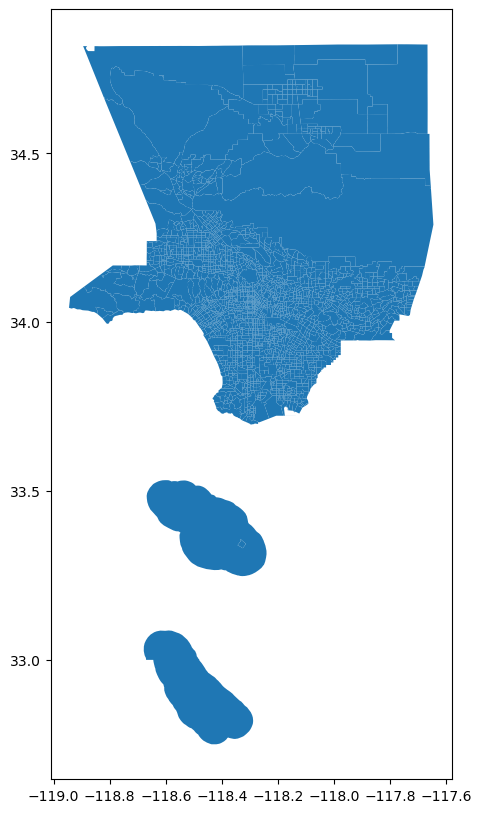

In [22]:
# Here is a snapshot of LA County 
tracts.plot(figsize=(12,10))

In [23]:
# Subsetting data. 
tracts = tracts[['CT20','geometry']]
tracts.head()

,CT20,geometry
0,101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2..."
1,101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2..."
2,101220,"POLYGON ((-118.28100 34.25592, -118.28198 34.2..."
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2..."
4,101222,"POLYGON ((-118.28594 34.25405, -118.28594 34.2..."


In [24]:
# Adding in a FIPS column. 
tracts['FIPS'] ='06' + '037' + tracts['CT20']

/opt/conda/lib/python3.11/site-packages/geopandas/geodataframe.py:1543: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [25]:
# That should have worked, let's see. 
tracts.head()

,CT20,geometry,FIPS
0,101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110
1,101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122
2,101220,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221
4,101222,"POLYGON ((-118.28594 34.25405, -118.28594 34.2...",06037101222


In [26]:
# Merging everything together into one dataset.
tracts_race=tracts.merge(rf2,on="FIPS")

In [27]:
# Checking again. 
tracts_race.head()

,CT20,geometry,FIPS,TotalPop,Non Hispanic,Non Hispanic White Alone,Non Hispanic Black Alone,Non Hispanic American Indian and Alaska Native Alone,Non Hispanic Asian Alone,Non Hispanic Native Hawaiian and Pacific Islander Alone,Non Hispanic Other Alone,Non Hispanic Multi Race,Hispanic
0,101110,"POLYGON ((-118.28491 34.25948, -118.28492 34.2...",06037101110,4926,3545,2840,65,7,434,8,14,177,1381
1,101122,"POLYGON ((-118.29015 34.27417, -118.29015 34.2...",06037101122,3728,3186,2614,31,7,392,0,23,119,542
2,101220,"POLYGON ((-118.28100 34.25592, -118.28198 34.2...",06037101220,3344,2263,1751,34,4,352,0,21,101,1081
3,101221,"POLYGON ((-118.28735 34.25591, -118.28863 34.2...",06037101221,3444,2266,1840,73,3,246,3,10,91,1178
4,101222,"POLYGON ((-118.28594 34.25405, -118.28594 34.2...",06037101222,2808,1768,1455,76,3,148,0,8,78,1040


In [28]:
# Based on our lab discussions, it will be helpful to understand whether there are clusters that are densely populated. I will need to run the percentages 
# prior to mapping everything separately. 
tracts_race['PCT_Black'] = tracts_race['Non Hispanic Black Alone']/tracts_race['TotalPop']*100
tracts_race['PCT_White'] = tracts_race['Non Hispanic White Alone']/tracts_race['TotalPop']*100
tracts_race['PCT_Asian'] = tracts_race['Non Hispanic Asian Alone']/tracts_race['TotalPop']*100
tracts_race['PCT_Hispanic'] = tracts_race['Hispanic']/tracts_race['TotalPop']*100

<Axes: >

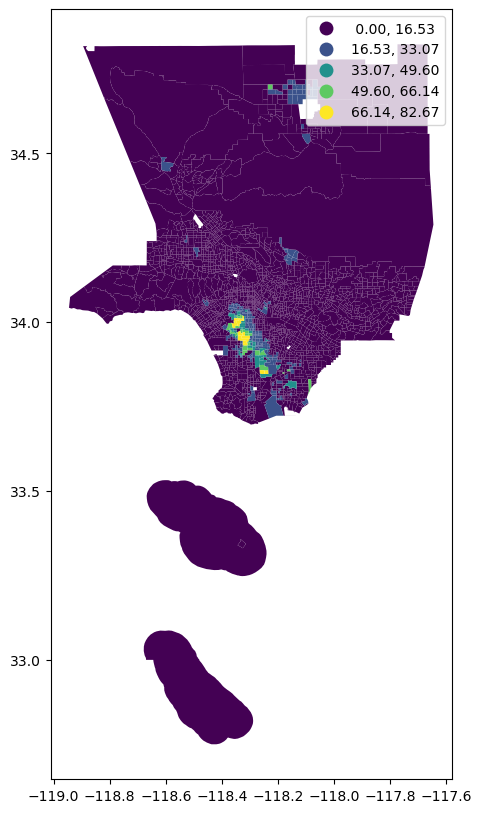

In [29]:
# Now that it has been converted, time to run some maps!
tracts_race.plot(figsize=(12,10),
                 column='PCT_Black',
                 legend=True, 
                 scheme='equal_interval')

In [30]:
# SPAs 1, 4, 6, 7, 8 look most populated. 

<Axes: >

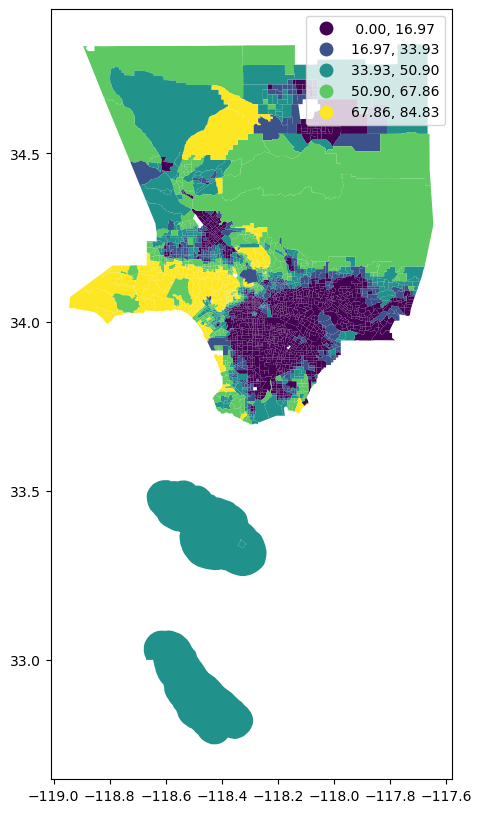

In [31]:
tracts_race.plot(figsize=(12,10),
                 column='PCT_White',
                 legend=True, 
                 scheme='equal_interval')

In [32]:
# SPAs 1, 2, 3, 5, 8 look the most populated. 

<Axes: >

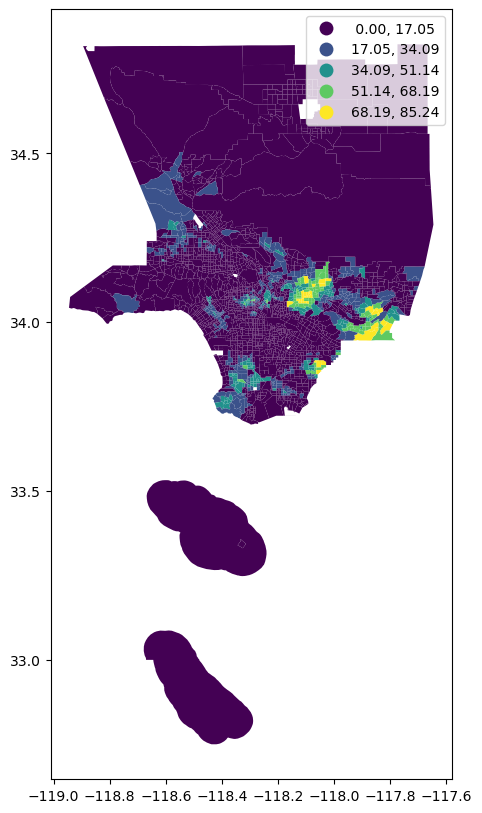

In [33]:
tracts_race.plot(figsize=(12,10),
                 column='PCT_Asian',
                 legend=True, 
                 scheme='equal_interval')

In [34]:
# SPA 2 (pretty minimal), 3, and 8.

<Axes: >

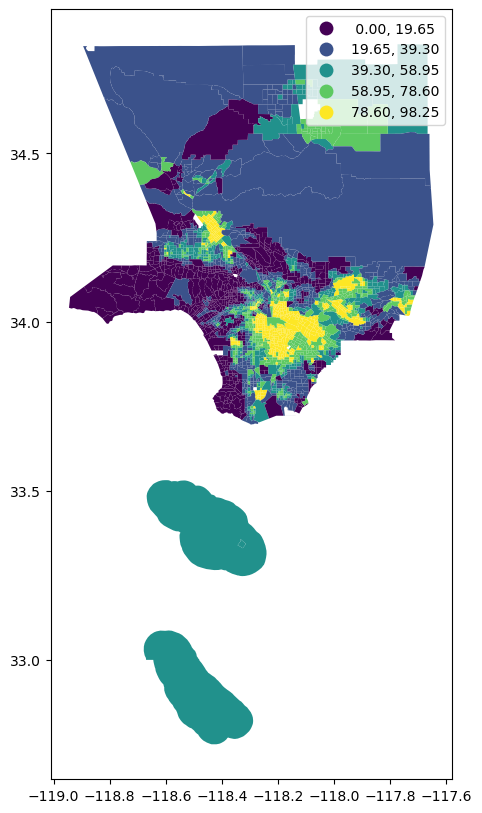

In [35]:
tracts_race.plot(figsize=(12,10),
                 column='PCT_Hispanic',
                 legend=True, 
                 scheme='equal_interval')

In [36]:
# SPAs 1, 2, 4, 6, 7, and 8.

In [37]:
# In regards to next steps, once we finalize our two spas to look at, I will likely re-run the maps. It will help contextualize 
# our analysis. 

In [1]:
### Group Members and Division of Labor 
# Maya Coronado: Analyzed race breakup and median household income across 5 SPAs in LA County. 
# Savannah Gourley: Analyzed low birth weight proportions out of all live births among 5 SPAs in LA County in 2021 using CalEnviroScreenData 
# Ashley Jahja: Analyzed SNAP usage and SNAP acceptance count across 5 SPAs in LA County from 2017-2023.
# Xander Lee: Analayzed childhood food access and visualization of 5 SPAs in LA County from 2015 - 2019. 
# Kiran Rao: Created code to trim down census tracts to only look at the 5 SPAs the team decided on. Analyzed birth rates (amount of women 
# giving birth per census tract and creating a percentage of women per tract who gave birth) using American Community Survey Data from 
# 2022 amongst the 5 chosen SPAs in Los Angeles County. 